In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
folder_path = '/content/drive/MyDrive/telecom/5sem'
video = os.path.join(folder_path, "person15_running_d1_uncomp.avi")

In [3]:
# import os
# folder_path = "/home/jupyter/work/resources"

In [4]:
video = []
for f in os.listdir(path = folder_path):
    if f[:6] == 'person':
        video.append(os.path.join(folder_path, f))

In [5]:
import torch
import torch.nn as nn

class ConvLSTMCell(nn.Module):
    def __init__(self, input_channels, hidden_channels, kernel_size=3):
        super().__init__()
        padding = kernel_size // 2
        self.input_channels = input_channels
        self.hidden_channels = hidden_channels

        self.conv = nn.Conv2d(
            input_channels + hidden_channels,
            4 * hidden_channels,
            kernel_size,
            padding=padding
        )

    def forward(self, x, h_prev, c_prev):
        combined = torch.cat([x, h_prev], dim=1)
        conv_output = self.conv(combined)

        cc_i, cc_f, cc_o, cc_g = torch.chunk(conv_output, 4, dim=1)
        i = torch.sigmoid(cc_i)
        f = torch.sigmoid(cc_f)
        o = torch.sigmoid(cc_o)
        g = torch.tanh(cc_g)

        c = f * c_prev + i * g
        h = o * torch.tanh(c)

        return h, c

In [6]:
class ConvLSTM(nn.Module):
    def __init__(self, input_channels=1, hidden_channels=64, kernel_size=3, pred_len=5):
        super().__init__()
        self.cell = ConvLSTMCell(input_channels, hidden_channels, kernel_size)
        self.conv_out = nn.Conv2d(hidden_channels, input_channels, kernel_size=1)
        self.pred_len = pred_len

    def forward(self, x_seq):
        B, T, C, H, W = x_seq.shape
        h = torch.zeros(B, self.cell.hidden_channels, H, W, device=x_seq.device)
        c = torch.zeros_like(h)

        for t in range(T):
            h, c = self.cell(x_seq[:, t], h, c)

        outputs = []
        x_in = x_seq[:, -1]
        for _ in range(self.pred_len):
            h, c = self.cell(x_in, h, c)
            x_in = self.conv_out(h)
            outputs.append(x_in)

        return torch.stack(outputs, dim=1)


In [7]:
import cv2

def check_info_about_video(video_path):
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print("Ошибка: не удалось открыть видео.")
    else:
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)


        ret, frame = cap.read()
        if ret:
            channels = frame.shape[2] if len(frame.shape) == 3 else 1

            print(f'Кадров: {frame_count}')
            print(f'Размер кадра: {width}x{height}')
            print(f'Число каналов: {channels}')
            print(f'FPS: {fps}')
        else:
            print("Не удалось считать первый кадр.")

    cap.release()
for _ in video:
    check_info_about_video(_)
    print('\n\n')

Кадров: 432
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0



Кадров: 160
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0



Кадров: 206
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0



Кадров: 581
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0



Кадров: 312
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0



Кадров: 408
Размер кадра: 160x120
Число каналов: 3
FPS: 25.0





In [8]:
import numpy as np

def load_video_tensor(path):
    cap = cv2.VideoCapture(path)
    frames = []

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (160, 120))
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = frame.astype(np.float32) / 255.0
        frames.append(frame)

    cap.release()


    video_np = np.stack(frames)
    video_np = np.transpose(video_np, (0, 3, 1, 2))
    video_tensor = torch.from_numpy(video_np)

    return video_tensor


In [9]:
video_tensor = load_video_tensor(video[0])
print(video_tensor.shape)


torch.Size([432, 3, 120, 160])


In [10]:
import cv2
import torch
import numpy as np
from torch.utils.data import Dataset

class VideoFrameDataset(Dataset):
    def __init__(self, video_paths, seq_len=10, pred_len=5):
        self.samples = []
        self.seq_len = seq_len
        self.pred_len = pred_len

        for path in video_paths:
            video = self.load_video_tensor(path)
            T = video.shape[0]
            for i in range(T - seq_len - pred_len + 1):
                x = video[i:i + seq_len]
                y = video[i + seq_len : i + seq_len + pred_len]
                self.samples.append((x, y))

    def load_video_tensor(self, path):
        cap = cv2.VideoCapture(path)
        frames = []

        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.resize(frame, (160, 120))
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = frame.astype(np.float32) / 255.0
            frames.append(frame)

        cap.release()
        video_np = np.stack(frames)
        video_np = np.transpose(video_np, (0, 3, 1, 2))
        return torch.from_numpy(video_np)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        x_seq, y_seq = self.samples[idx]
        return x_seq, y_seq



In [11]:
from torch.utils.data import DataLoader

dataset = VideoFrameDataset(video, seq_len=10)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [12]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [13]:
def show_sequence_from_loader(model, dataloader, device, seq_index=0):
    model.eval()
    with torch.no_grad():
        x_seq_batch, target_batch = next(iter(dataloader))
        x_seq = x_seq_batch[seq_index].unsqueeze(0).to(device)
        target_seq = target_batch[seq_index].cpu()

        pred_seq = model(x_seq)[0].cpu()

        frames = x_seq[0].cpu().permute(0, 2, 3, 1).numpy()

        fig, ax = plt.subplots()
        im = ax.imshow(frames[0], cmap='gray' if frames.shape[-1] == 1 else None)
        ax.set_title("Входные кадры")
        plt.axis('off')

        def update(i):
            im.set_array(frames[i])
            ax.set_title(f"Кадр {i+1}")
            return [im]

        ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=400, blit=True)
        plt.close(fig)
        display(HTML(ani.to_jshtml()))

        fig, axs = plt.subplots(2, 5, figsize=(15, 5))
        for i in range(5):
            axs[0, i].imshow(pred_seq[i].permute(1, 2, 0).squeeze(), cmap='gray')
            axs[0, i].set_title(f"🔮 Pred {i+1}")
            axs[0, i].axis('off')

            axs[1, i].imshow(target_seq[i].permute(1, 2, 0).squeeze(), cmap='gray')
            axs


In [14]:
import torch.optim as optim
from tqdm import tqdm

In [15]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
def visualize_fixed_sample(model, x_fixed, target_fixed, epoch):
    model.eval()
    with torch.no_grad():
        pred_seq = model(x_fixed)[0].cpu()
        input_frames = x_fixed[0].cpu().permute(0, 2, 3, 1).numpy()

        fig, ax = plt.subplots()
        im = ax.imshow(input_frames[0], cmap='gray' if input_frames.shape[-1] == 1 else None)
        ax.set_title("Входные кадры")
        plt.axis('off')

        def update(i):
            im.set_array(input_frames[i])
            ax.set_title(f"Кадр {i+1}")
            return [im]

        ani = animation.FuncAnimation(fig, update, frames=len(input_frames), interval=400, blit=True)
        plt.close(fig)
        print(f"\n Предсказание после эпохи {epoch}:")
        display(HTML(ani.to_jshtml()))

        fig, axs = plt.subplots(2, 5, figsize=(15, 5))

        for i in range(5):
            pred_frame = pred_seq[i].permute(1, 2, 0).squeeze()
            true_frame = target_fixed[i].permute(1, 2, 0).squeeze()

            axs[0, i].imshow(pred_frame, cmap='gray' if pred_frame.ndim == 2 else None)
            axs[0, i].set_title(f" Pred {i+1}")
            axs[0, i].axis('off')

            axs[1, i].imshow(true_frame, cmap='gray' if true_frame.ndim == 2 else None)
            axs[1, i].set_title(f" True {i+1}")
            axs[1, i].axis('off')

        plt.tight_layout()
        plt.show()


In [21]:
pip install pytorch-msssim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 44.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [22]:
from pytorch_msssim import ssim

def ssim_loss(pred, target):
    return 1 - ssim(pred, target, data_range=1.0, size_average=True)


In [34]:
def gradient_loss(pred, target):
    dx = torch.abs(pred[:, :, :, 1:] - pred[:, :, :, :-1])
    dy = torch.abs(pred[:, :, 1:, :] - pred[:, :, :-1, :])
    dx_gt = torch.abs(target[:, :, :, 1:] - target[:, :, :, :-1])
    dy_gt = torch.abs(target[:, :, 1:, :] - target[:, :, :-1, :])
    return torch.mean(torch.abs(dx - dx_gt)) + torch.mean(torch.abs(dy - dy_gt))


# Loss = MSE + SSIM

In [24]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display


def train_convlstm(model, dataloader, losses, num_epochs=10, lr=1e-3, hidden_size = 64):
    import torch
    import torch.nn as nn
    import torch.optim as optim
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation
    from IPython.display import HTML, display
    from tqdm import tqdm

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    x_fixed_batch, target_fixed_batch = next(iter(dataloader))
    x_fixed = x_fixed_batch[0].unsqueeze(0).to(device)
    target_fixed = target_fixed_batch[0].cpu()

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for x_seq, target_seq in tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            x_seq = x_seq.to(device)
            target_seq = target_seq.to(device)

            optimizer.zero_grad()
            output = model(x_seq)
            mse = criterion(output, target_seq)
            ssim_l = ssim_loss(output, target_seq)
            loss = mse + 0.1 * ssim_l
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        losses[hidden_size].append(avg_loss)
        print(f"\n Epoch {epoch+1}/{num_epochs} — Loss: {avg_loss:.6f}")

        visualize_fixed_sample(model, x_fixed, target_fixed, epoch+1)


# Loss = MSE + Gradient loss

In [35]:
def train_convlstm(model, dataloader, losses, num_epochs=10, lr=1e-3, hidden_size = 64):
    import torch
    import torch.nn as nn
    import torch.optim as optim
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation
    from IPython.display import HTML, display
    from tqdm import tqdm

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    x_fixed_batch, target_fixed_batch = next(iter(dataloader))
    x_fixed = x_fixed_batch[0].unsqueeze(0).to(device)
    target_fixed = target_fixed_batch[0].cpu()

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for x_seq, target_seq in tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            x_seq = x_seq.to(device)
            target_seq = target_seq.to(device)

            optimizer.zero_grad()
            output = model(x_seq)
            mse = criterion(output, target_seq)
            ssim_l = ssim_loss(output, target_seq)
            grad_l = gradient_loss(output, target_seq)
            loss = mse + 0.1 * grad_l
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        losses[hidden_size].append(avg_loss)
        print(f"\n Epoch {epoch+1}/{num_epochs} — Loss: {avg_loss:.6f}")

        visualize_fixed_sample(model, x_fixed, target_fixed, epoch+1)


Epoch 1/10: 100%|██████████| 252/252 [02:58<00:00,  1.41it/s]



 Epoch 1/10 — Loss: 0.030402

 Предсказание после эпохи 1:


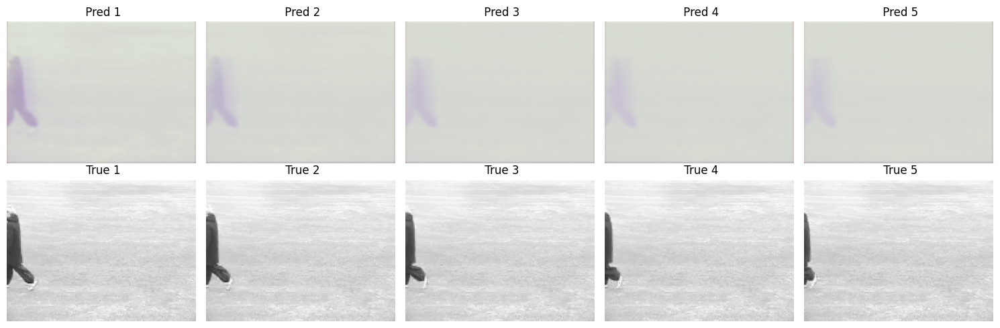

Epoch 2/10: 100%|██████████| 252/252 [02:58<00:00,  1.41it/s]



 Epoch 2/10 — Loss: 0.007953

 Предсказание после эпохи 2:


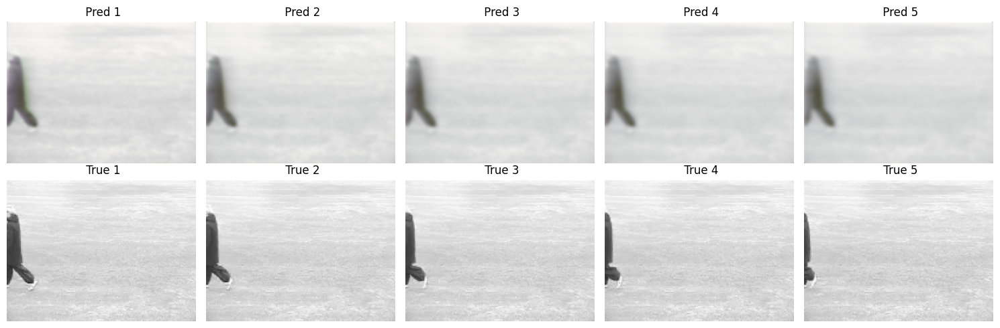

Epoch 3/10: 100%|██████████| 252/252 [02:58<00:00,  1.41it/s]



 Epoch 3/10 — Loss: 0.005783

 Предсказание после эпохи 3:


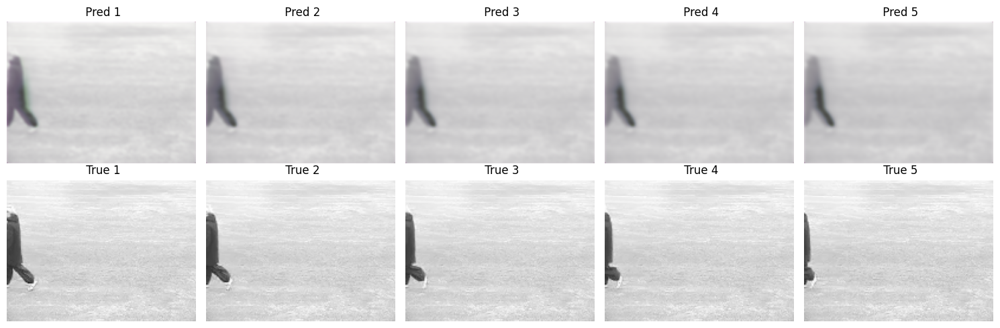

Epoch 4/10: 100%|██████████| 252/252 [02:59<00:00,  1.41it/s]



 Epoch 4/10 — Loss: 0.005505

 Предсказание после эпохи 4:


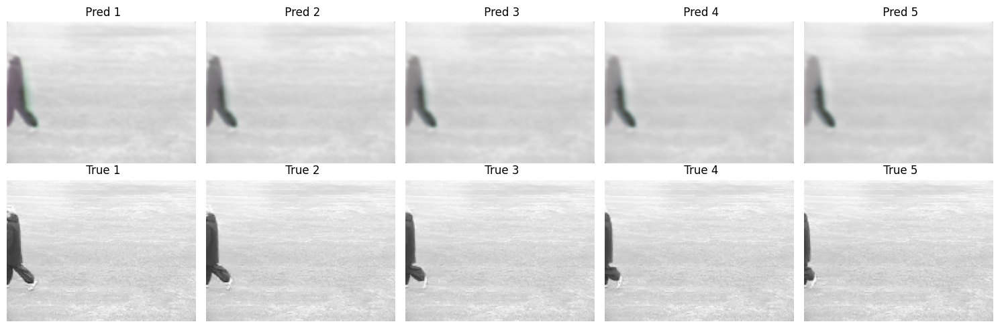

Epoch 5/10: 100%|██████████| 252/252 [02:59<00:00,  1.41it/s]



 Epoch 5/10 — Loss: 0.005214

 Предсказание после эпохи 5:


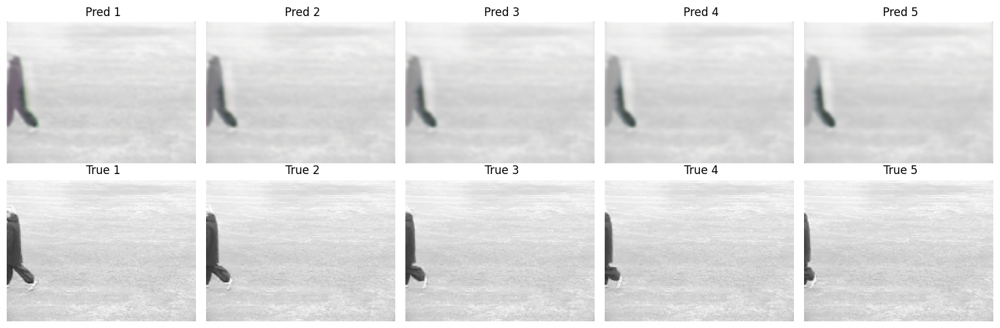

Epoch 6/10: 100%|██████████| 252/252 [02:59<00:00,  1.41it/s]



 Epoch 6/10 — Loss: 0.005091

 Предсказание после эпохи 6:


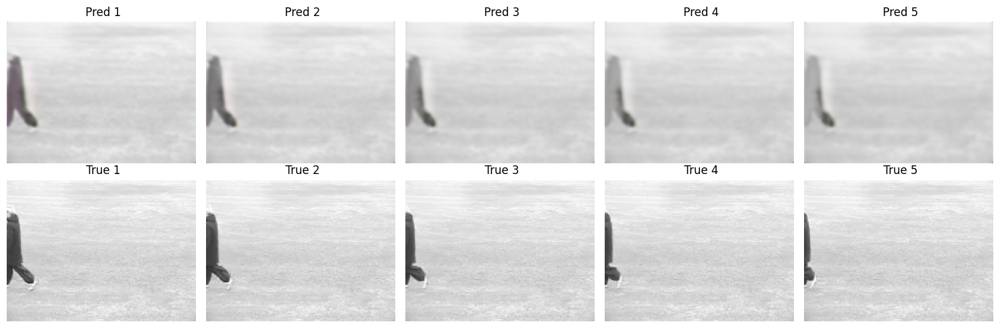

Epoch 7/10: 100%|██████████| 252/252 [02:58<00:00,  1.41it/s]



 Epoch 7/10 — Loss: 0.005147

 Предсказание после эпохи 7:


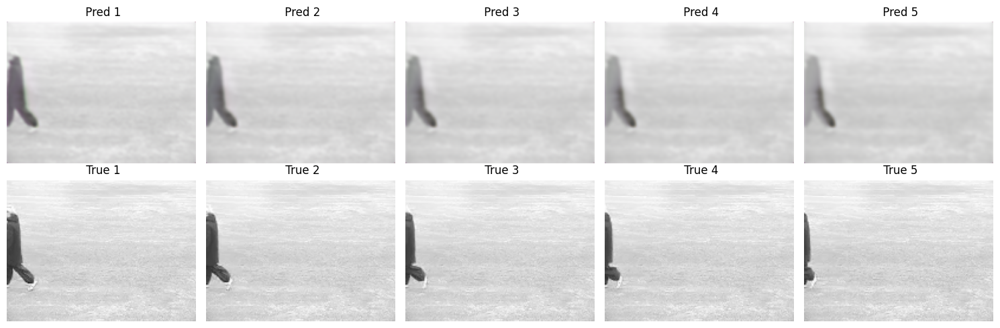

Epoch 8/10: 100%|██████████| 252/252 [02:58<00:00,  1.41it/s]



 Epoch 8/10 — Loss: 0.005110

 Предсказание после эпохи 8:


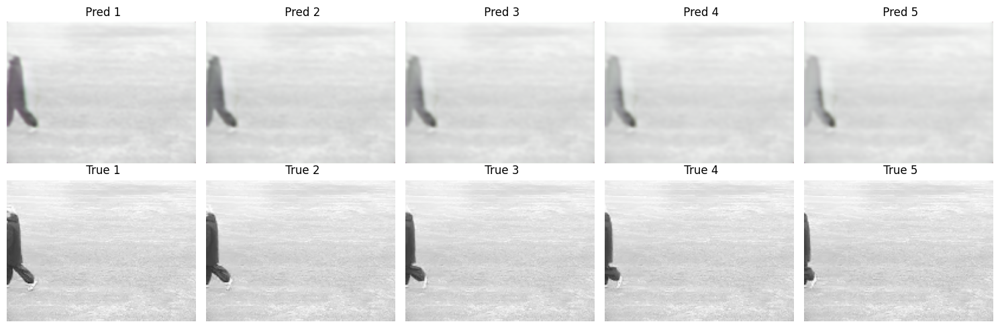

Epoch 9/10: 100%|██████████| 252/252 [02:59<00:00,  1.41it/s]



 Epoch 9/10 — Loss: 0.005115

 Предсказание после эпохи 9:


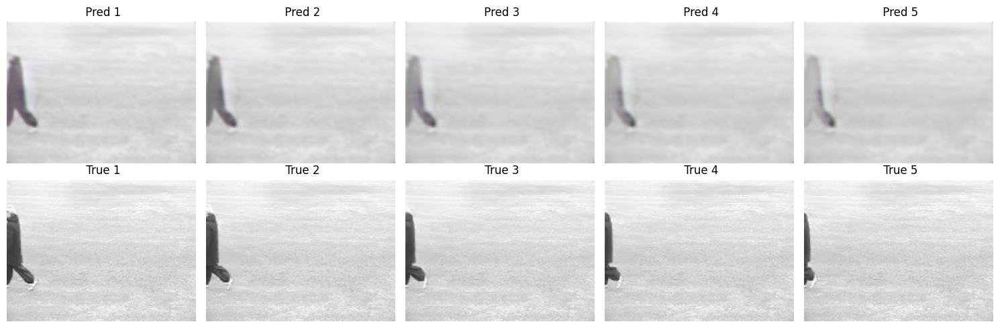

Epoch 10/10: 100%|██████████| 252/252 [02:59<00:00,  1.40it/s]



 Epoch 10/10 — Loss: 0.004919

 Предсказание после эпохи 10:


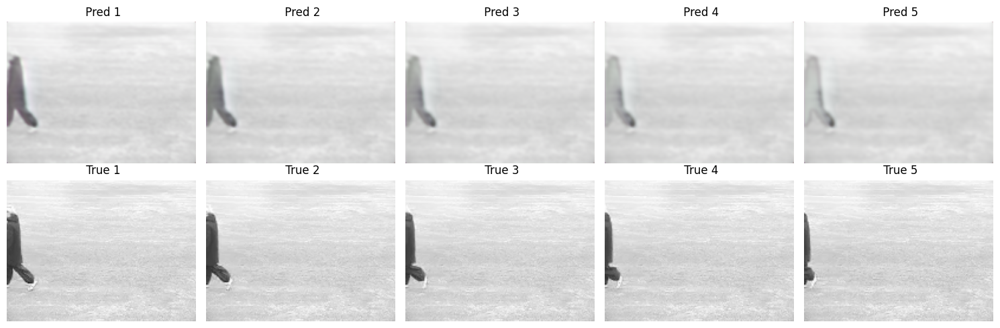

In [ ]:
num_epochs = 50
model = ConvLSTM(input_channels=3, hidden_channels=64)
train_convlstm(model, dataloader, num_epochs=10, lr=1e-3)

In [ ]:
torch.save(model.state_dict(), 'convlstm_model.pth')

# PredRNN

In [ ]:
class ST_LSTM_Cell(nn.Module):
    def __init__(self, in_channels, hidden_channels, kernel_size, bias=True):
        super().__init__()
        padding = kernel_size // 2
        self.conv_x = nn.Conv2d(in_channels, hidden_channels * 7, kernel_size, padding=padding, bias=bias)
        self.conv_h = nn.Conv2d(hidden_channels, hidden_channels * 4, kernel_size, padding=padding, bias=bias)
        self.conv_m = nn.Conv2d(hidden_channels, hidden_channels * 3, kernel_size, padding=padding, bias=bias)
        self.conv_o = nn.Conv2d(hidden_channels * 2, hidden_channels, kernel_size, padding=padding, bias=bias)
        self.conv_last = nn.Conv2d(hidden_channels * 2, hidden_channels, 1, padding=0, bias=bias)

    def forward(self, x, h, c, m):
        x_concat = self.conv_x(x)
        h_concat = self.conv_h(h)
        m_concat = self.conv_m(m)

        i_x, f_x, g_x, i_mx, f_mx, g_mx, o_x = torch.chunk(x_concat, 7, dim=1)
        i_h, f_h, g_h, o_h = torch.chunk(h_concat, 4, dim=1)
        i_m, f_m, g_m = torch.chunk(m_concat, 3, dim=1)

        i = torch.sigmoid(i_x + i_h)
        f = torch.sigmoid(f_x + f_h)
        g = torch.tanh(g_x + g_h)
        c_new = f * c + i * g

        i_m = torch.sigmoid(i_mx + i_m)
        f_m = torch.sigmoid(f_mx + f_m)
        g_m = torch.tanh(g_mx + g_m)
        m_new = f_m * m + i_m * g_m

        mem = torch.cat([c_new, m_new], dim=1)
        o = torch.sigmoid(o_x + o_h + self.conv_o(mem))
        h_new = o * torch.tanh(self.conv_last(mem))

        return h_new, c_new, m_new


In [ ]:
class PredRNN(nn.Module):
    def __init__(self, input_channels=1, hidden_channels=64, kernel_size=5, num_layers=4, pred_len=5):
        super().__init__()
        self.num_layers = num_layers
        self.pred_len = pred_len
        self.hidden_channels = hidden_channels

        self.cells = nn.ModuleList([
            ST_LSTM_Cell(input_channels if i == 0 else hidden_channels, hidden_channels, kernel_size)
            for i in range(num_layers)
        ])

        self.conv_out = nn.Conv2d(hidden_channels, input_channels, kernel_size=1)

    def forward(self, x):
        B, T, C, H, W = x.shape
        h = [torch.zeros(B, self.hidden_channels, H, W, device=x.device) for _ in range(self.num_layers)]
        c = [torch.zeros_like(h[0]) for _ in range(self.num_layers)]
        m = torch.zeros_like(h[0])

        outputs = []

        for t in range(T + self.pred_len):
            x_in = x[:, t] if t < T else outputs[-1]

            for i, cell in enumerate(self.cells):
                h[i], c[i], m = cell(x_in, h[i], c[i], m)
                x_in = h[i]

            outputs.append(self.conv_out(x_in))

        return torch.stack(outputs[T:], dim=1)


Epoch 1/10: 100%|██████████| 338/338 [32:14<00:00,  5.72s/it]


 Epoch 1/10 — Loss: 0.018745



 Предсказание после эпохи 1:


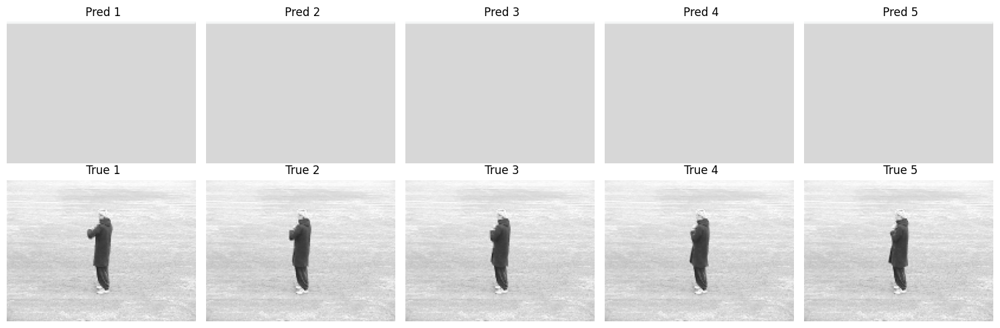

Epoch 2/10: 100%|██████████| 338/338 [32:05<00:00,  5.70s/it]



 Epoch 2/10 — Loss: 0.013872

 Предсказание после эпохи 2:


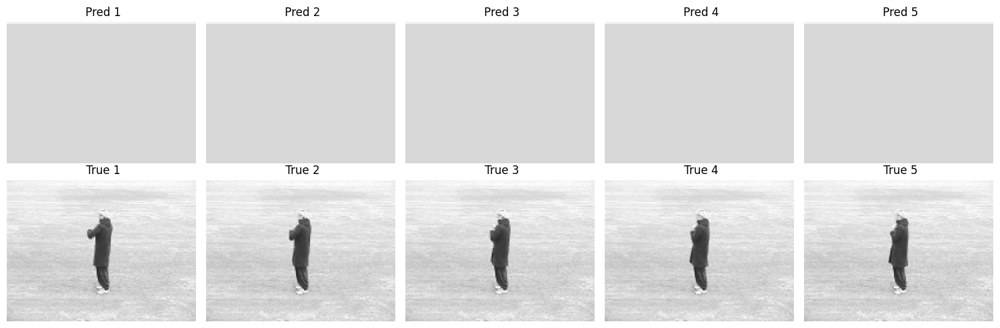

Epoch 3/10: 100%|██████████| 338/338 [32:03<00:00,  5.69s/it]


 Epoch 3/10 — Loss: 0.013872



 Предсказание после эпохи 3:


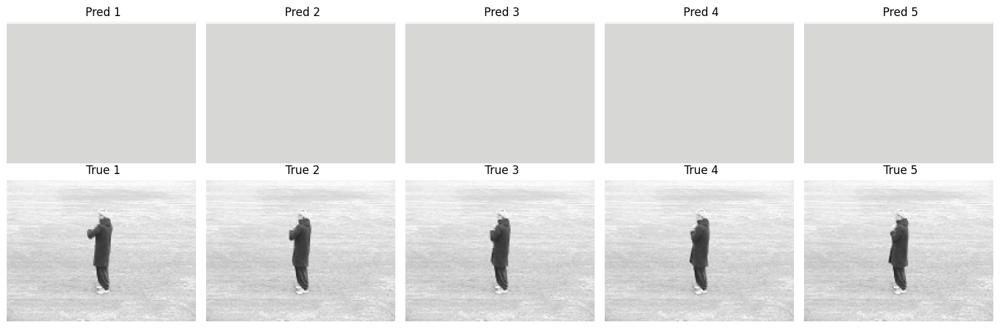

Epoch 4/10:  12%|█▏        | 41/338 [03:53<28:08,  5.69s/it]

In [ ]:
num_epochs = 50
model = PredRNN(input_channels=3, hidden_channels=64, pred_len=5)
train_convlstm(model, dataloader, num_epochs=10, lr=1e-3)

# Проверка другого количества скрытых слоёв

In [20]:
num_epochs = 50
hidden_sizes = [16, 32, 128]
losses = {
    16: [],
    32: [],
    128: [],
}
for h in hidden_sizes:
    model = ConvLSTM(input_channels=3, hidden_channels=h)
    train_convlstm(model, dataloader, num_epochs=3, lr=1e-3, losses = losses, hidden_size=h)

    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(losses[h]) + 1), losses[h], marker='o')
    plt.title(f'Loss over Epochs (hidden size = {h})')
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.grid(True)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [28]:
num_epochs = 10
hidden_sizes = [16, 32]
losses = {
    16: [],
    32: [],
    128: [],
}
for h in hidden_sizes:
    model = ConvLSTM(input_channels=3, hidden_channels=h)
    train_convlstm(model, dataloader, num_epochs=num_epochs, lr=1e-3, losses = losses, hidden_size=h)

    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(losses[h]) + 1), losses[h], marker='o')
    plt.title(f'Loss over Epochs (hidden size = {h})')
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.grid(True)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

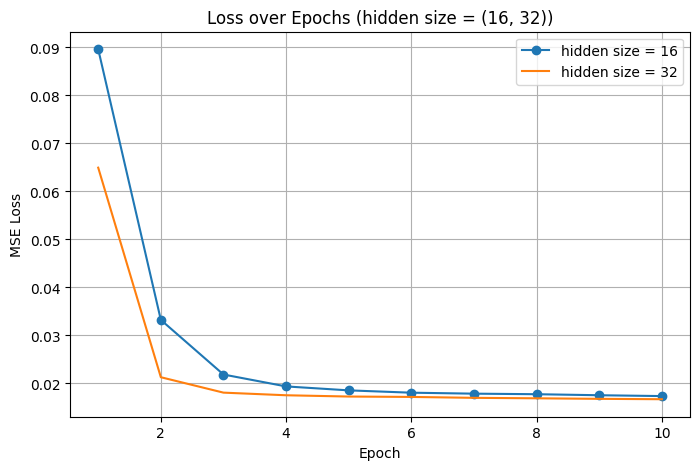

In [33]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(losses[16]) + 1), losses[16], marker='o', label='hidden size = 16')
plt.plot(range(1, len(losses[32]) + 1), losses[32], label='hidden size = 32')
plt.title(f'Loss over Epochs (hidden size = {16, 32})')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.legend()
plt.show()

In [36]:
num_epochs = 10
hidden_sizes = [16, 32]
losses = {
    16: [],
    32: [],
    128: [],
}
for h in hidden_sizes:
    model = ConvLSTM(input_channels=3, hidden_channels=h)
    train_convlstm(model, dataloader, num_epochs=num_epochs, lr=1e-3, losses = losses, hidden_size=h)

    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(losses[h]) + 1), losses[h], marker='o')
    plt.title(f'Loss over Epochs (hidden size = {h})')
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.grid(True)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

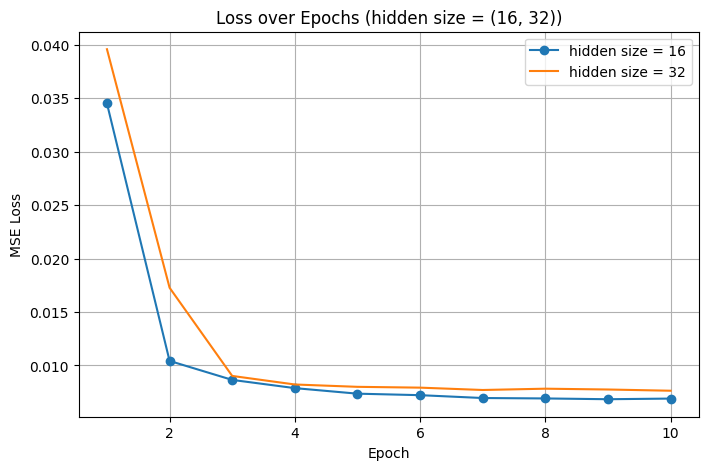

In [37]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(losses[16]) + 1), losses[16], marker='o', label='hidden size = 16')
plt.plot(range(1, len(losses[32]) + 1), losses[32], label='hidden size = 32')
plt.title(f'Loss over Epochs (hidden size = {16, 32})')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.legend()
plt.show()